In [74]:
import kagglehub

# Download latest version
path = kagglehub.competition_download('store-sales-time-series-forecasting')

print("Path to competition files:", path)

Path to competition files: /kaggle/input/competitions/store-sales-time-series-forecasting


First, we will load these datasets first and inspect the datasets

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

In [2]:


holidays_events = pd.read_csv("/kaggle/input/competitions/store-sales-time-series-forecasting/holidays_events.csv")
oil = pd.read_csv("/kaggle/input/competitions/store-sales-time-series-forecasting/oil.csv")
stores = pd.read_csv("/kaggle/input/competitions/store-sales-time-series-forecasting/stores.csv")
train = pd.read_csv("/kaggle/input/competitions/store-sales-time-series-forecasting/train.csv")
transactions = pd.read_csv("/kaggle/input/competitions/store-sales-time-series-forecasting/transactions.csv")
test = pd.read_csv("/kaggle/input/competitions/store-sales-time-series-forecasting/test.csv")

In [3]:
test.head()

,id,date,store_nbr,family,onpromotion
0,3000888,2017-08-16,1,AUTOMOTIVE,0
1,3000889,2017-08-16,1,BABY CARE,0
2,3000890,2017-08-16,1,BEAUTY,2
3,3000891,2017-08-16,1,BEVERAGES,20
4,3000892,2017-08-16,1,BOOKS,0


In [6]:
stores.head(53)

,store_nbr,city,state,type,cluster
0,1,Quito,Pichincha,D,13
1,2,Quito,Pichincha,D,13
2,3,Quito,Pichincha,D,8
3,4,Quito,Pichincha,D,9
4,5,Santo Domingo,Santo Domingo de los Tsachilas,D,4
5,6,Quito,Pichincha,D,13
6,7,Quito,Pichincha,D,8
7,8,Quito,Pichincha,D,8
8,9,Quito,Pichincha,B,6
9,10,Quito,Pichincha,C,15


In [7]:
holidays_events.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350 entries, 0 to 349
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   date         350 non-null    object
 1   type         350 non-null    object
 2   locale       350 non-null    object
 3   locale_name  350 non-null    object
 4   description  350 non-null    object
 5   transferred  350 non-null    bool  
dtypes: bool(1), object(5)
memory usage: 14.1+ KB


In [8]:
oil.info()
oil.describe()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1218 entries, 0 to 1217
Data columns (total 2 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   date        1218 non-null   object 
 1   dcoilwtico  1175 non-null   float64
dtypes: float64(1), object(1)
memory usage: 19.2+ KB


,dcoilwtico
count,1175.000000
mean,67.714366
std,25.630476
min,26.190000
25%,46.405000
50%,53.190000
75%,95.660000
max,110.620000


In [9]:
train.describe()

,id,store_nbr,sales,onpromotion
count,3.000888e+06,3.000888e+06,3.000888e+06,3.000888e+06
mean,1.500444e+06,2.750000e+01,3.577757e+02,2.602770e+00
std,8.662819e+05,1.558579e+01,1.101998e+03,1.221888e+01
min,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00
25%,7.502218e+05,1.400000e+01,0.000000e+00,0.000000e+00
50%,1.500444e+06,2.750000e+01,1.100000e+01,0.000000e+00
75%,2.250665e+06,4.100000e+01,1.958473e+02,0.000000e+00
max,3.000887e+06,5.400000e+01,1.247170e+05,7.410000e+02


In [10]:
train.head(60000)

,id,date,store_nbr,family,sales,onpromotion
0,0,2013-01-01,1,AUTOMOTIVE,0.0,0
1,1,2013-01-01,1,BABY CARE,0.0,0
2,2,2013-01-01,1,BEAUTY,0.0,0
3,3,2013-01-01,1,BEVERAGES,0.0,0
4,4,2013-01-01,1,BOOKS,0.0,0
...,...,...,...,...,...,...
59995,59995,2013-02-03,42,BABY CARE,0.0,0
59996,59996,2013-02-03,42,BEAUTY,0.0,0
59997,59997,2013-02-03,42,BEVERAGES,0.0,0
59998,59998,2013-02-03,42,BOOKS,0.0,0


**Data Visualization and exploration**

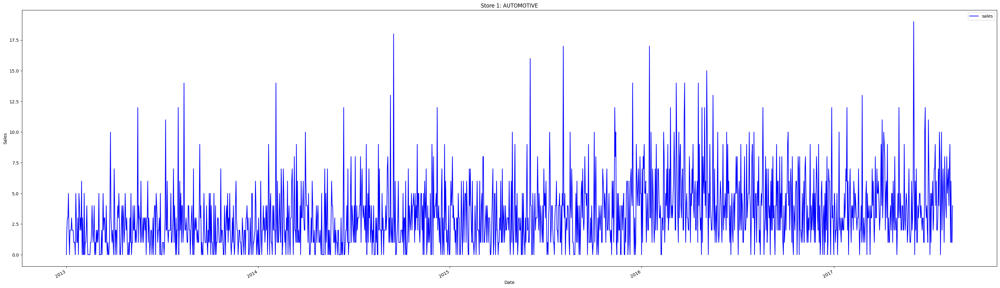

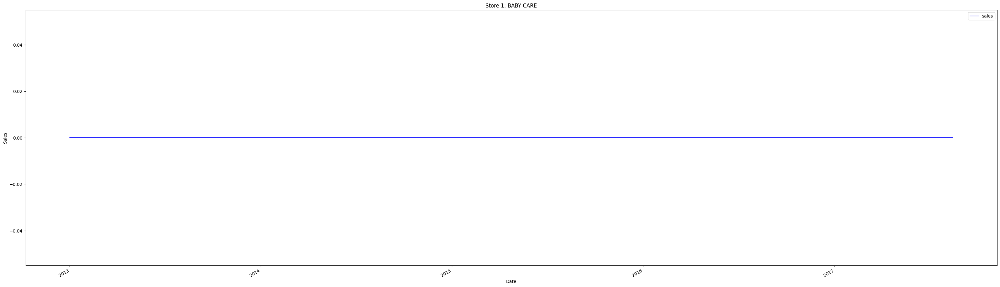

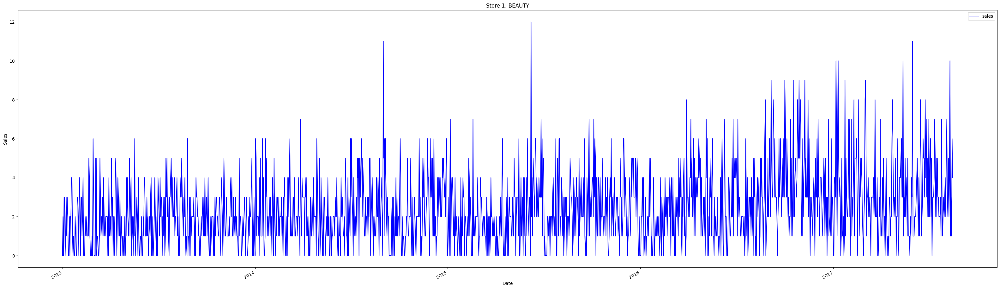

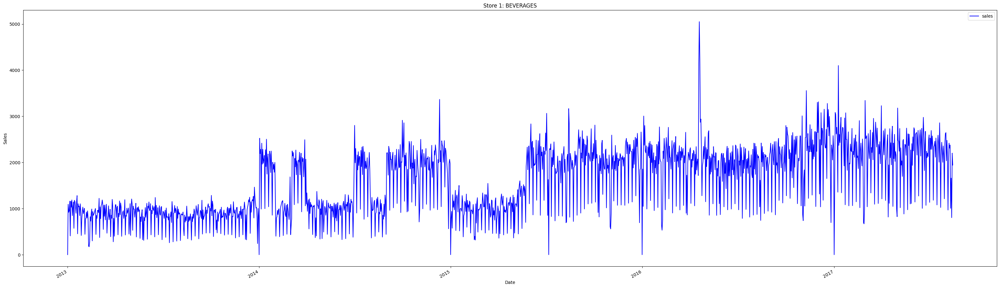

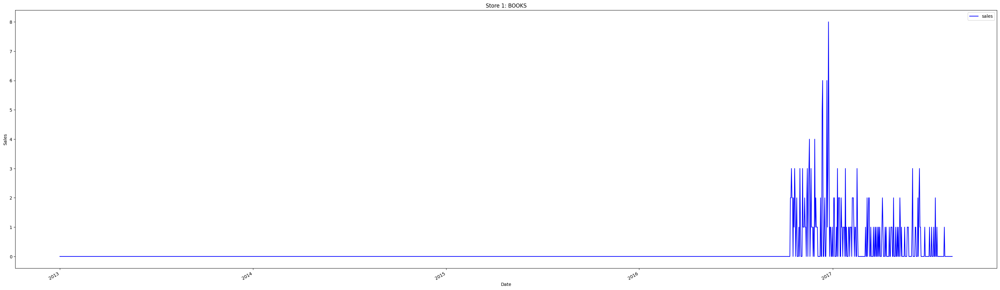

...

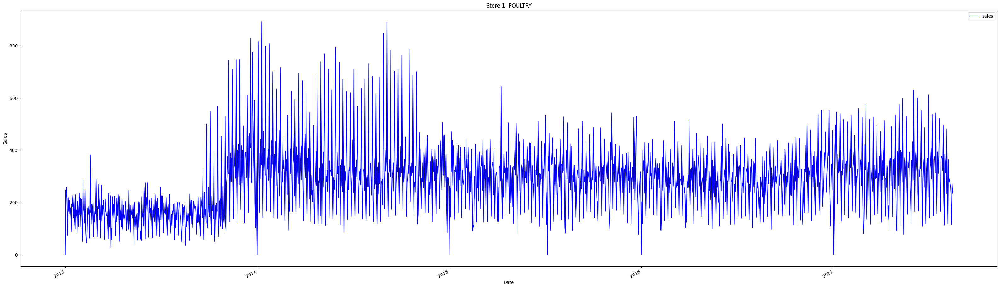

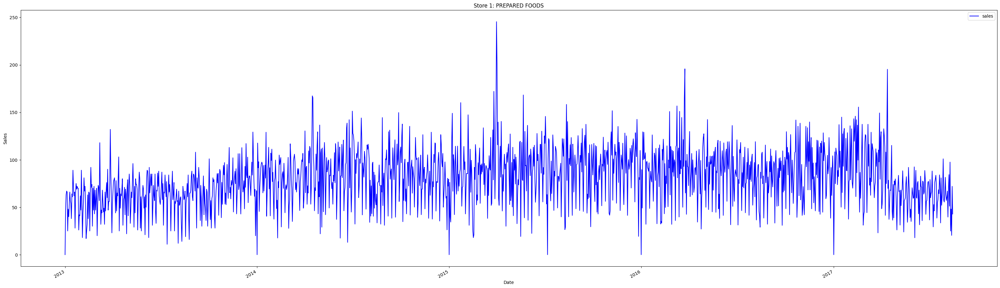

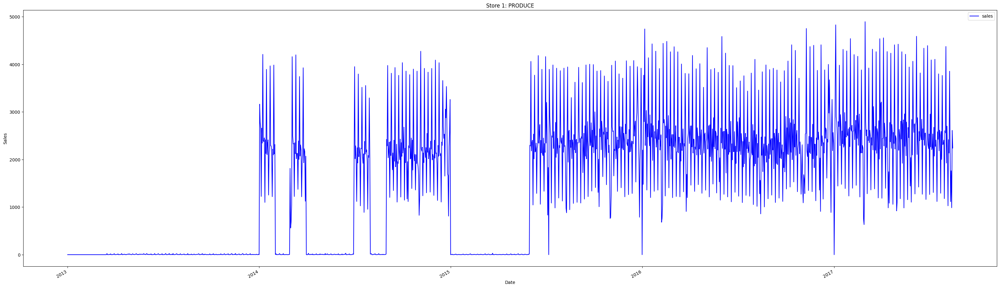

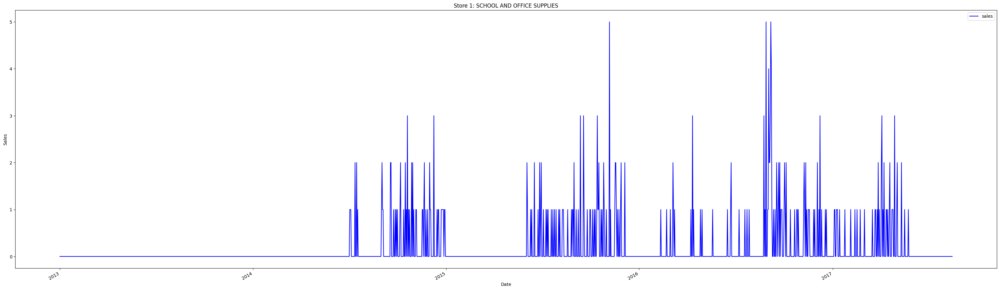

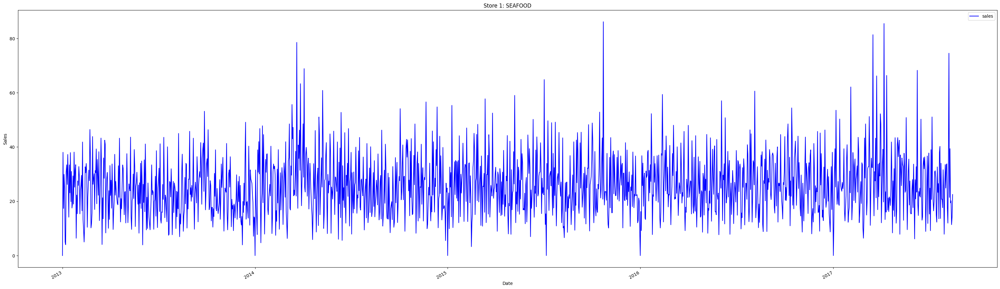

In [11]:
each_store_sales = train.groupby(["store_nbr", "family"])
store_nbr=train['store_nbr'].unique()
family=train['family'].unique()
"""
for store in store_nbr:
    for fam in family:
        group_data = each_store_sales.get_group((1, fam)).copy()
        group_data['date'] = pd.to_datetime(group_data['date'])
        group_data = group_data.sort_values('date')

        ax = group_data.plot(
            x='date', 
            y='sales', 
            kind='line', 
            title=f"Store {store}: {fam}",
            figsize=(40, 12),  
            linewidth=1.5,   
            color='blue'     
        )
        ax.set_xlabel("Date") 
        ax.set_ylabel("Sales")

        plt.show()
"""
for fam in family:
        group_data = each_store_sales.get_group((1, fam)).copy()
        group_data['date'] = pd.to_datetime(group_data['date'])
        group_data = group_data.sort_values('date')

        ax = group_data.plot(
            x='date', 
            y='sales', 
            kind='line', 
            title=f"Store {1}: {fam}",
            figsize=(40, 12),  
            linewidth=1.5,   
            color='blue'     
        )
        ax.set_xlabel("Date") 
        ax.set_ylabel("Sales")

        plt.show()

As we can see from the graphs,there is a seasonality in Frozen food. Trends in Dairy, Beverages etc. 
Then, for simplicity, we ignore which store and only care about the "family" column.

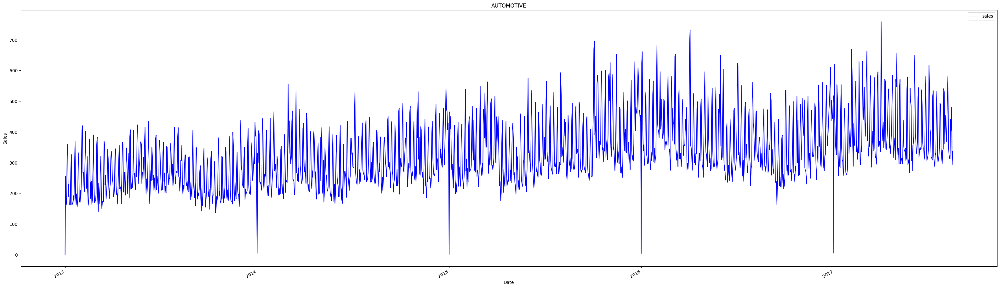

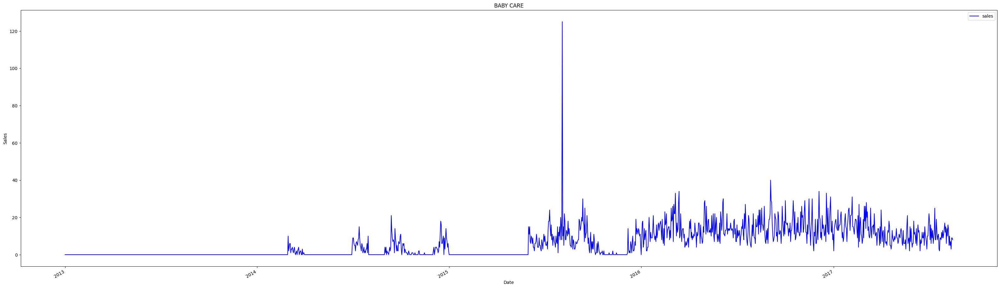

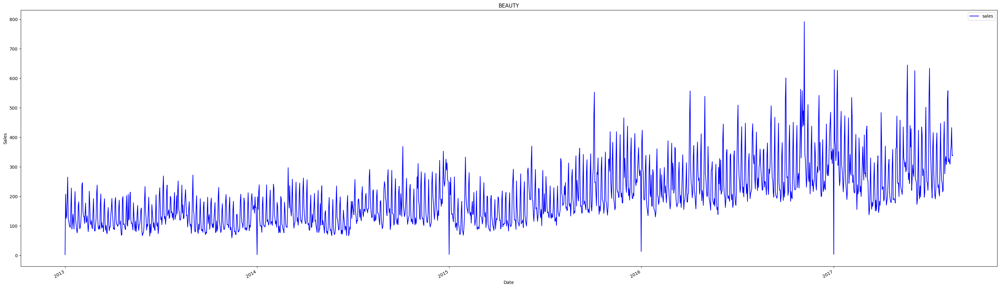

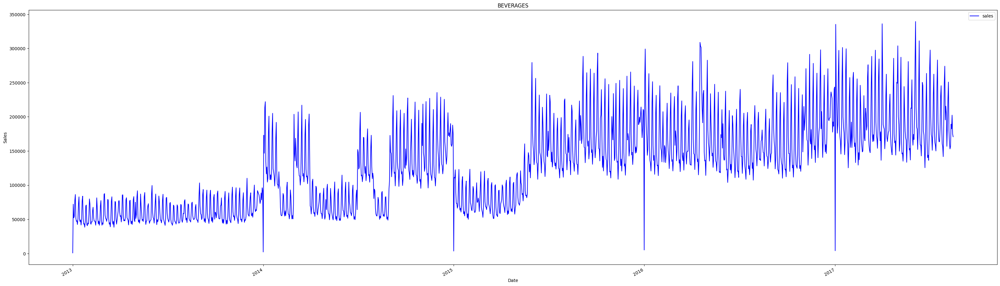

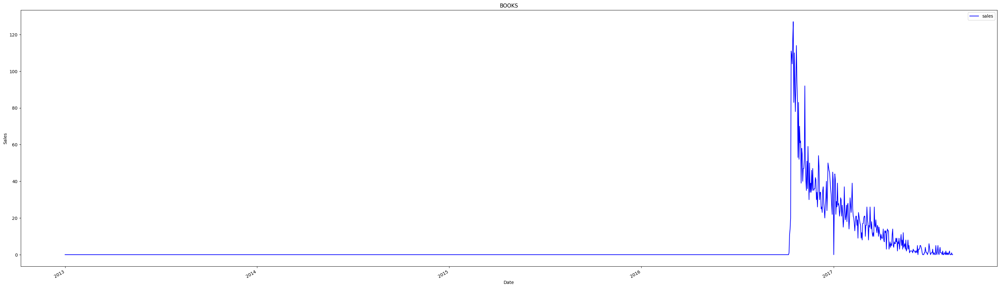

...

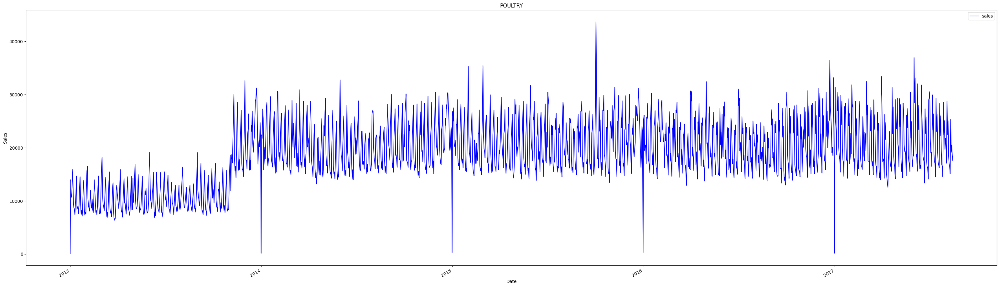

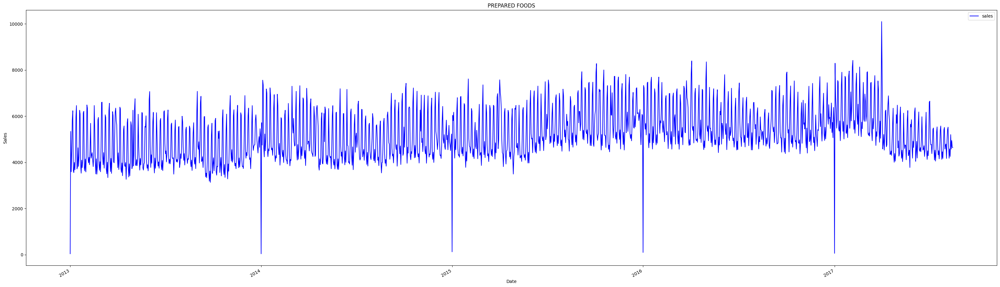

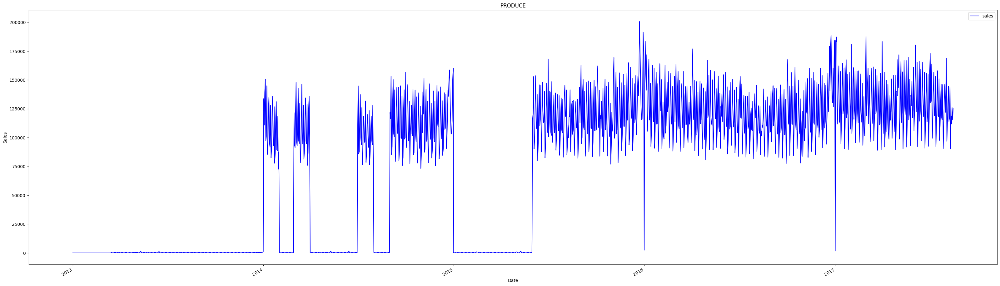

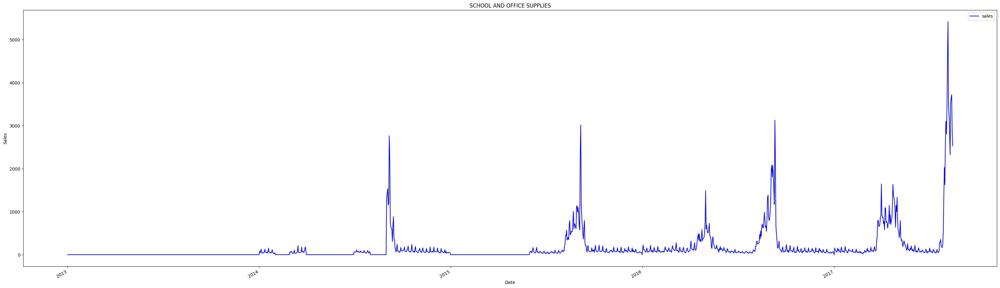

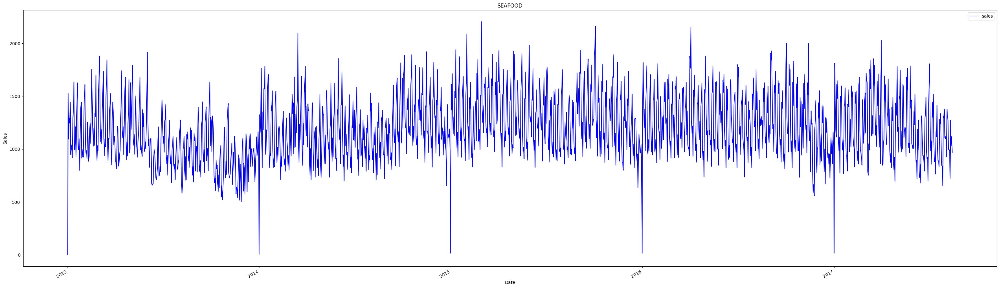

In [12]:
family=train['family'].unique()

for fam in family:
    sum_family_sales = train.groupby("family")
    sum_family_sales = sum_family_sales.get_group(fam)
    sum_family_sales = sum_family_sales.groupby('date', as_index=False)['sales'].sum()
    sum_family_sales['date'] = pd.to_datetime(sum_family_sales['date'])
    ax = sum_family_sales.plot(x='date', y='sales',  kind='line', title=f"{fam}",figsize=(40, 12),  color='blue')
    ax.set_xlabel("Date") 
    ax.set_ylabel("Sales")

    plt.show()


In [16]:
def make_lags(ts, lags):
    return pd.concat(
        {
            f'y_lag_{i}': ts.shift(i)
            for i in range(1, lags + 1)
        },
        axis=1)

PACF Values:
 [ 1.          0.51536676 -0.16539196  0.14095107 -0.01278641  0.11884956
  0.47608565  0.54364236 -0.09428993 -0.14438209 -0.03937278]


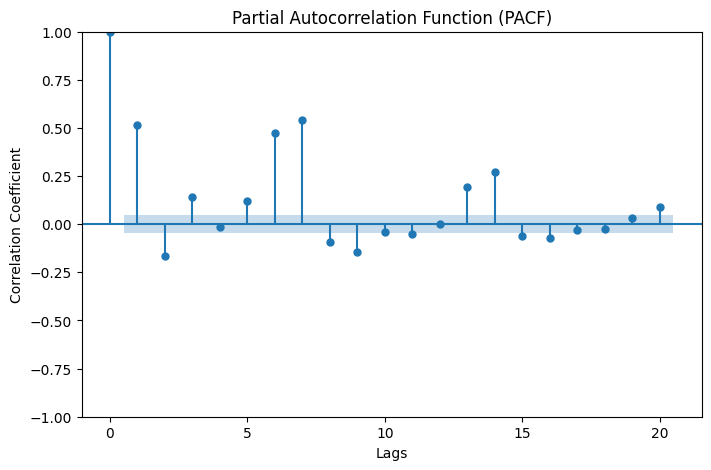

PACF Values:
 [ 1.          0.69125774  0.37866671  0.19396902  0.16054705  0.15037547
  0.14859729  0.15659932  0.04831085  0.04303886 -0.00145737]


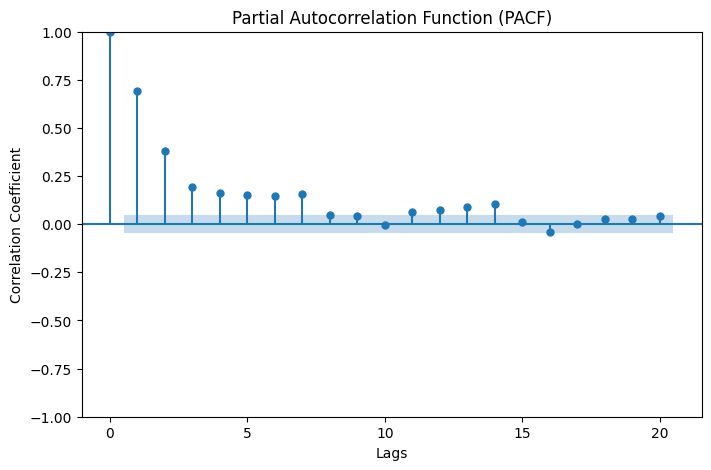

PACF Values:
 [ 1.          0.68073205 -0.06033076  0.21081628  0.06463271  0.16963525
  0.48723602  0.48352942 -0.23208089 -0.20117987 -0.01289342]


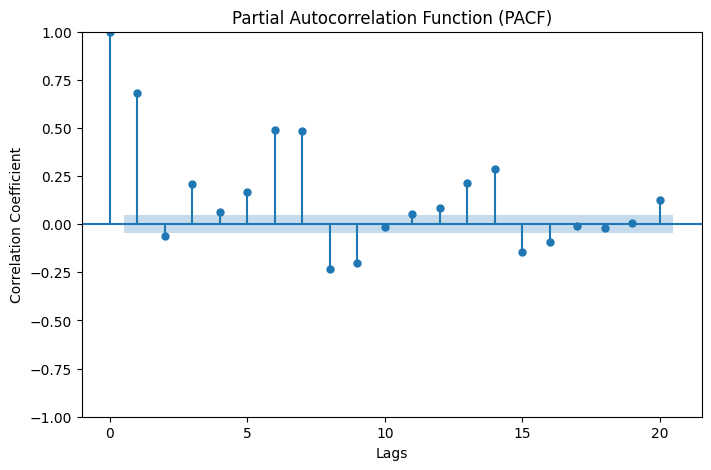

PACF Values:
 [ 1.          0.80829911 -0.08934128  0.27350469  0.10277269  0.27254881
  0.53619142  0.45024603 -0.20950167 -0.14520073 -0.01277242]


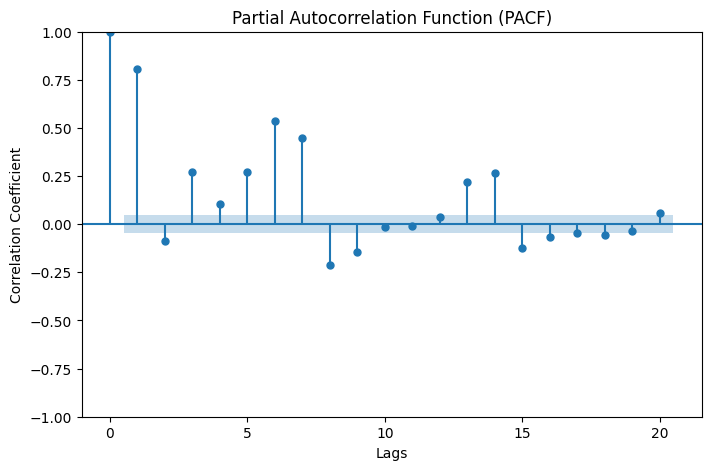

PACF Values:
 [ 1.          0.93905108  0.27180669  0.14731046  0.0537043  -0.12701666
  0.15868758 -0.15552632  0.06474396  0.01656744 -0.04199645]


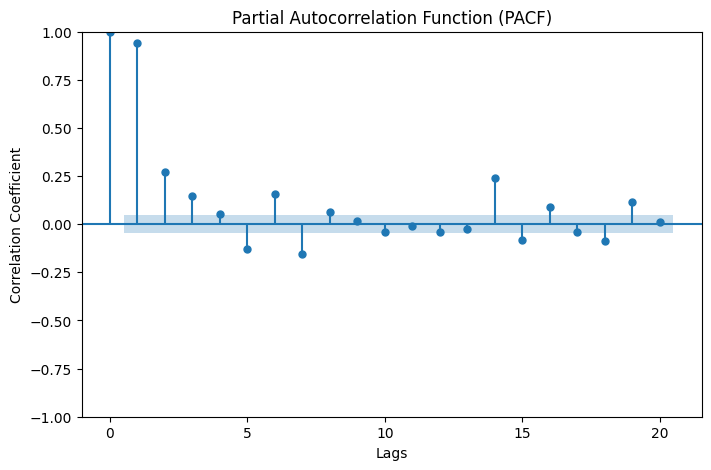

PACF Values:
 [ 1.          0.58927454 -0.15716801  0.1466738   0.03795262  0.18597462
  0.5306826   0.6217853  -0.07163636 -0.08639479 -0.02292641]


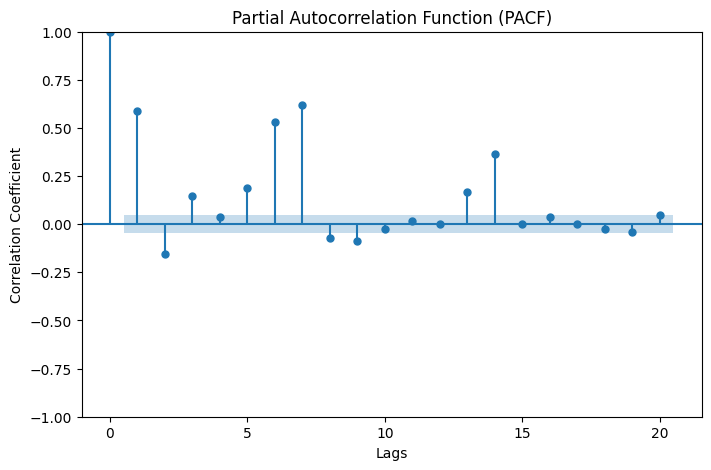

PACF Values:
 [ 1.          0.86840645  0.10795616  0.18669668  0.17591967  0.23362872
  0.37268614  0.41104967 -0.28856983 -0.16626982 -0.06868355]


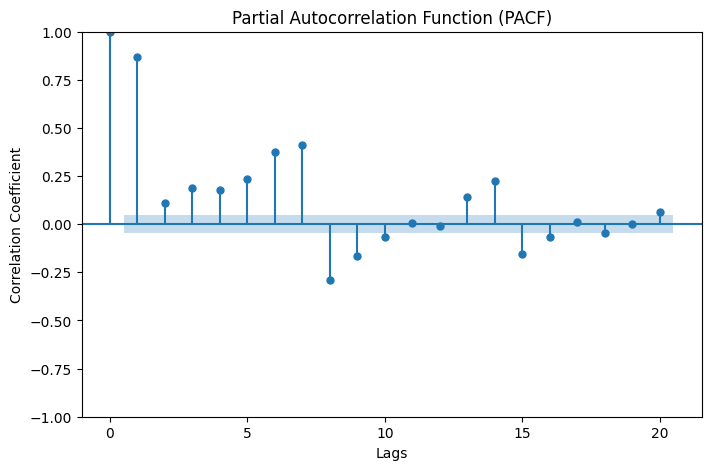

PACF Values:
 [ 1.          0.57789085 -0.21796845  0.13740358 -0.04732968  0.13599075
  0.42490866  0.29637601 -0.2410327  -0.19457813  0.03958774]


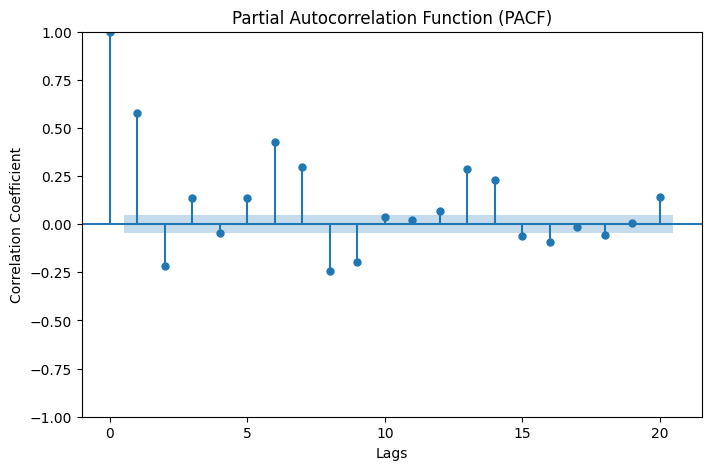

PACF Values:
 [ 1.00000000e+00  7.13408658e-01 -8.12403387e-02  3.01594885e-01
  5.19403429e-02  2.18324128e-01  5.57265425e-01  5.50034409e-01
 -6.89947803e-02 -6.90612887e-02  8.48506550e-04]


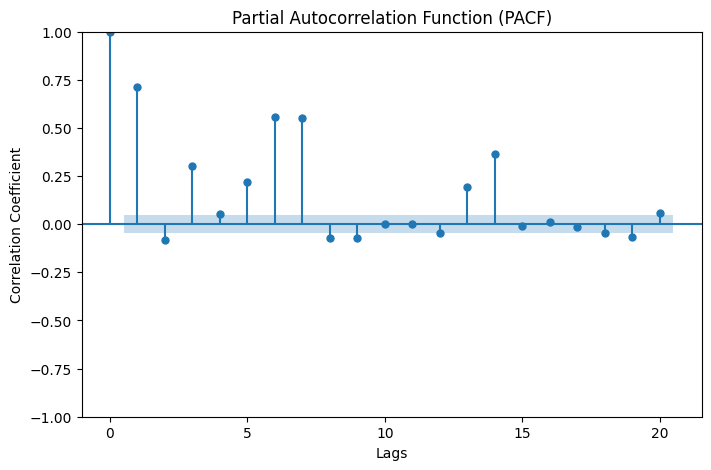

PACF Values:
 [ 1.          0.60538689 -0.17318806 -0.01764024  0.09729616  0.27877844
  0.4295178   0.50995033 -0.14662592 -0.10257485 -0.06800799]


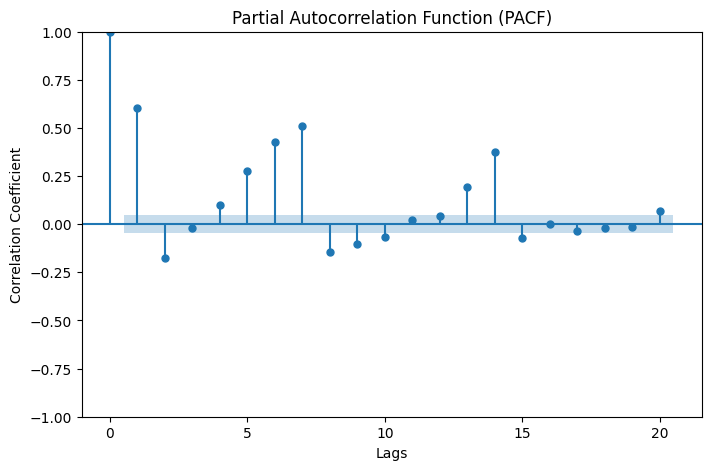

PACF Values:
 [ 1.          0.50282234 -0.23471522 -0.10382047  0.01409112  0.19327367
  0.43583615  0.64610931 -0.09847584 -0.00908828 -0.02805921]


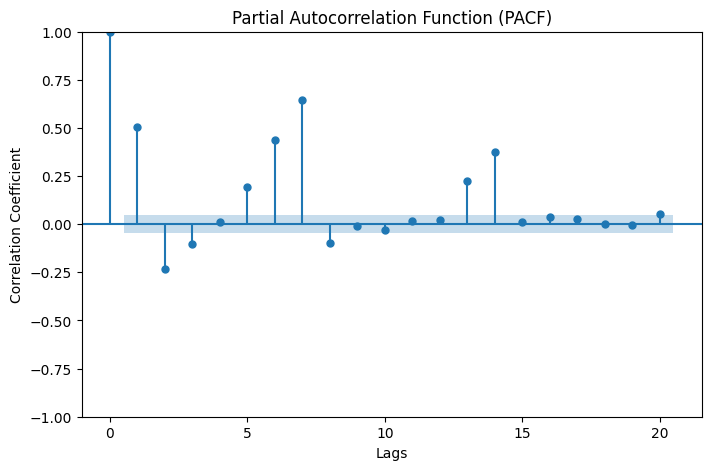

PACF Values:
 [ 1.          0.91710948 -0.19838908  0.05692201  0.12465683  0.04615924
  0.07119044 -0.19014842 -0.24993973  0.12998229  0.00253541]


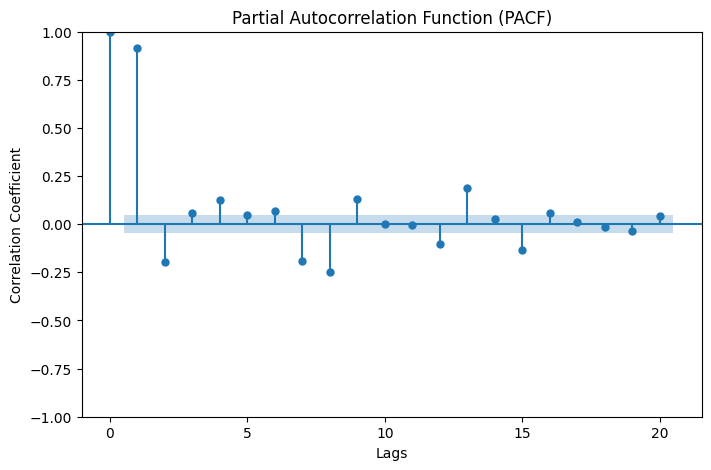

PACF Values:
 [ 1.          0.66695145 -0.18176373  0.19645593 -0.00171083  0.19359515
  0.45938018  0.26901378 -0.21811053 -0.16319896  0.06843231]


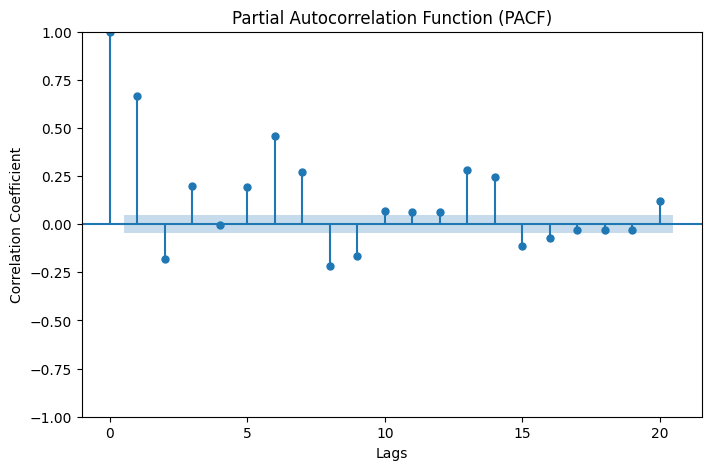

PACF Values:
 [ 1.          0.60583757  0.03302965  0.15096203  0.0984524   0.21826048
  0.31450953  0.1309155  -0.06273796 -0.08580857 -0.08974172]


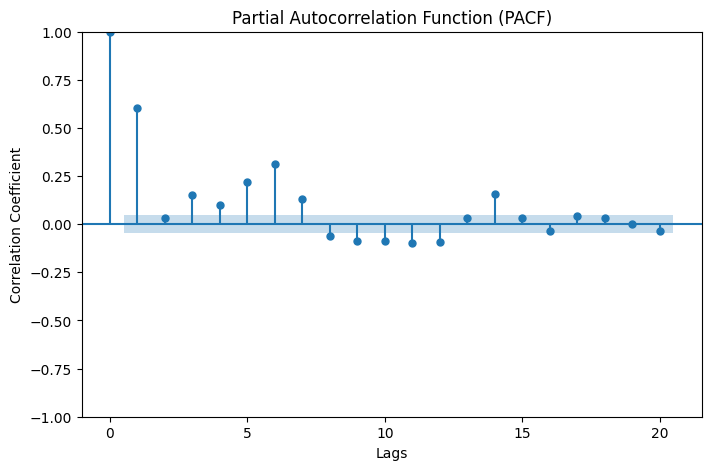

PACF Values:
 [ 1.          0.51265229  0.03621763  0.18026943  0.07975796  0.10104491
  0.32536258  0.37174345 -0.01346345 -0.10223858 -0.01725287]


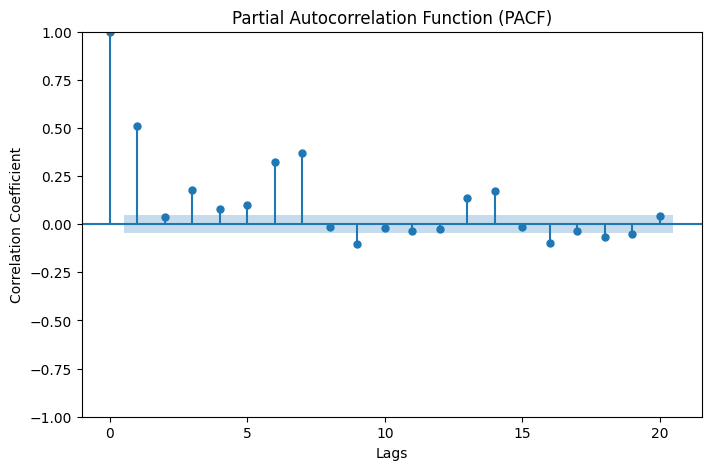

PACF Values:
 [ 1.          0.87387682  0.24822642  0.22338935  0.13242555  0.18111981
  0.22370292  0.13479823 -0.01552359 -0.10974302 -0.02493437]


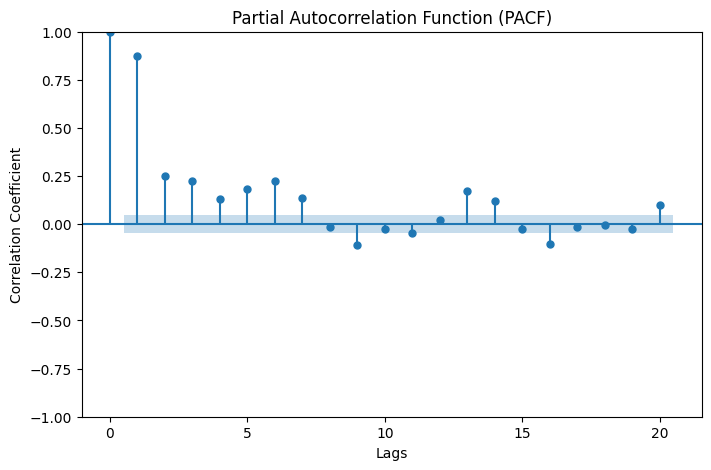

PACF Values:
 [ 1.          0.8988464   0.04318018  0.3354183   0.08469023  0.18369669
  0.48000683  0.29383705 -0.25807718 -0.20420035  0.00554254]


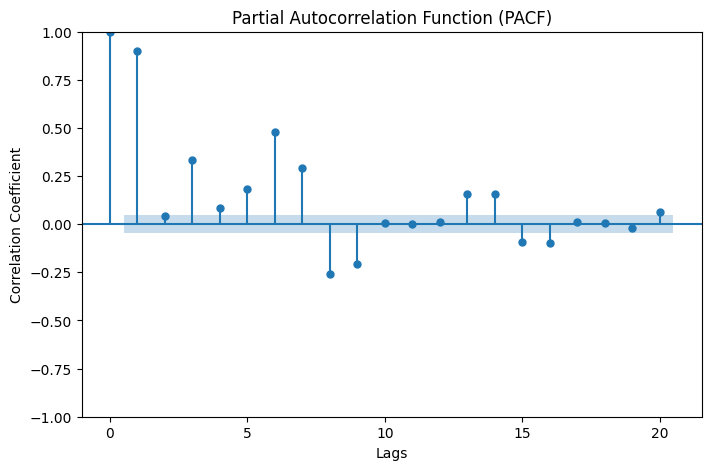

PACF Values:
 [ 1.          0.71910557  0.15328268  0.25946637  0.11482165  0.13637001
  0.32473626  0.35956217 -0.05855992 -0.17441631 -0.0621564 ]


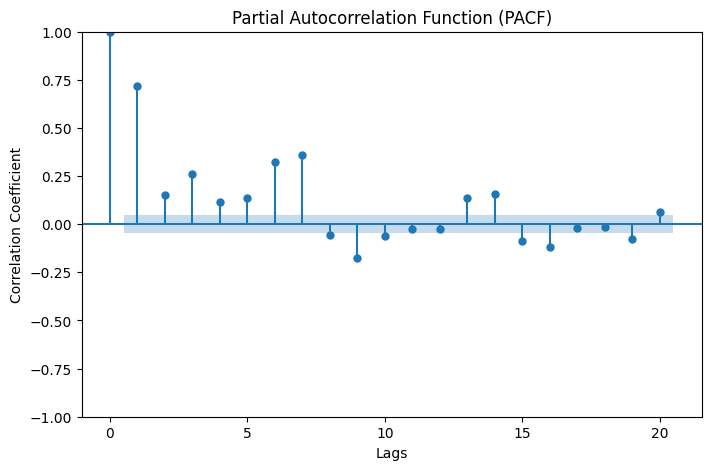

PACF Values:
 [ 1.          0.89860077 -0.05024862  0.30692766  0.07144102  0.2201289
  0.41380722  0.20645117 -0.32247878 -0.13358111  0.06953503]


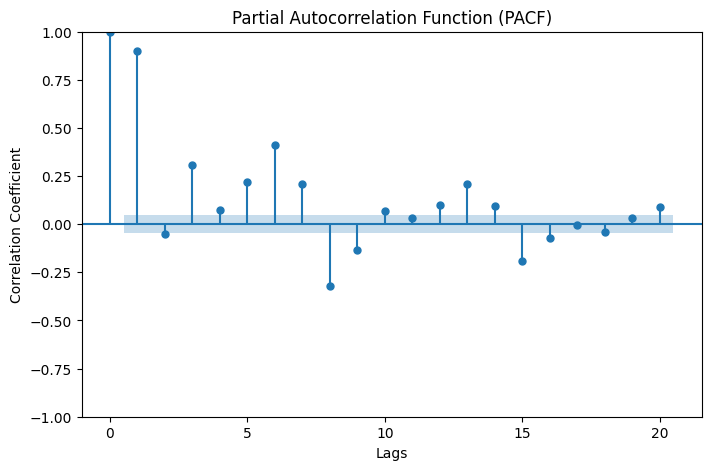

PACF Values:
 [ 1.          0.7672015  -0.03689162  0.31161781  0.06358236  0.19636301
  0.51902236  0.5300733  -0.34138643 -0.11774416 -0.08463394]


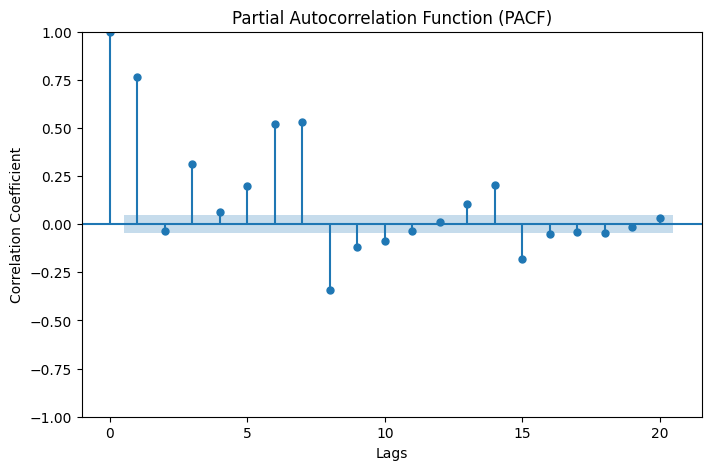

PACF Values:
 [1.         0.70188326 0.00945658 0.2784149  0.10863696 0.10598931
 0.24899875 0.16817578 0.01947161 0.06262993 0.09457269]


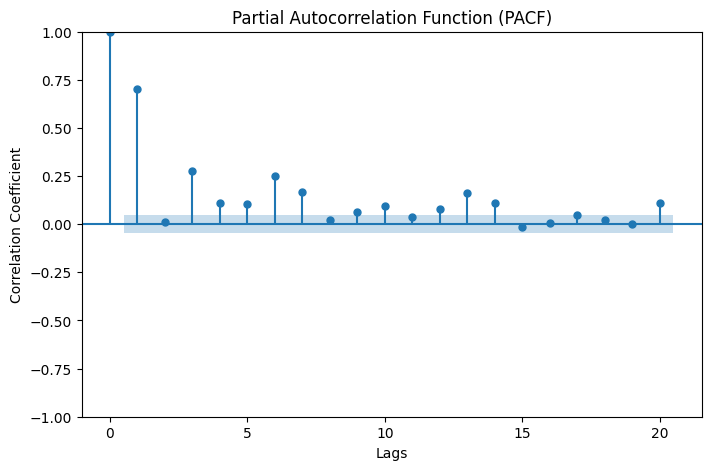

PACF Values:
 [ 1.          0.59500166  0.0592138   0.20452587  0.02018647  0.15067274
  0.33530234  0.31961958 -0.09147926 -0.22508415 -0.06818618]


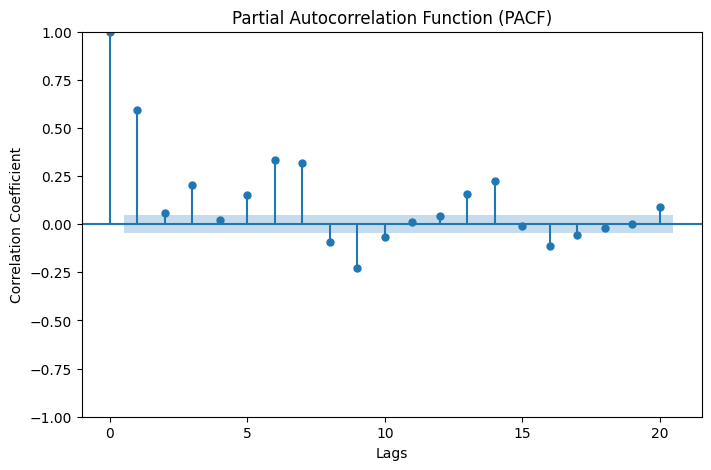

PACF Values:
 [ 1.          0.28878453 -0.0694884  -0.01387804 -0.03711675  0.0298921
  0.2359665   0.58814843 -0.27040784 -0.07745078 -0.05964805]


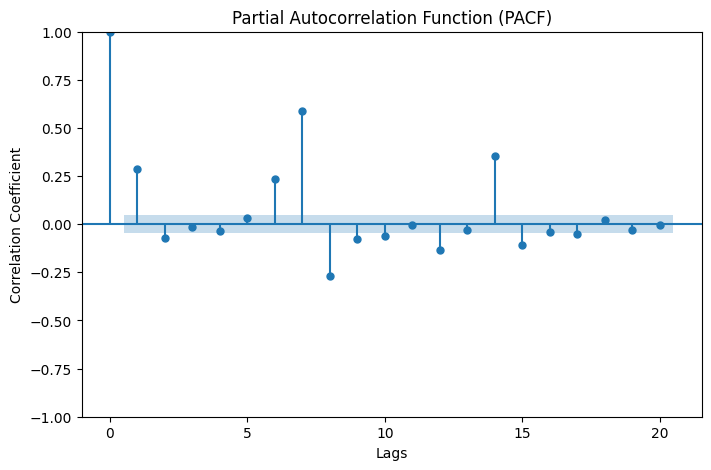

PACF Values:
 [ 1.          0.91810579 -0.14947845  0.27413576  0.11390506  0.28415882
  0.36136828  0.10824449 -0.30155831 -0.03456375  0.09924559]


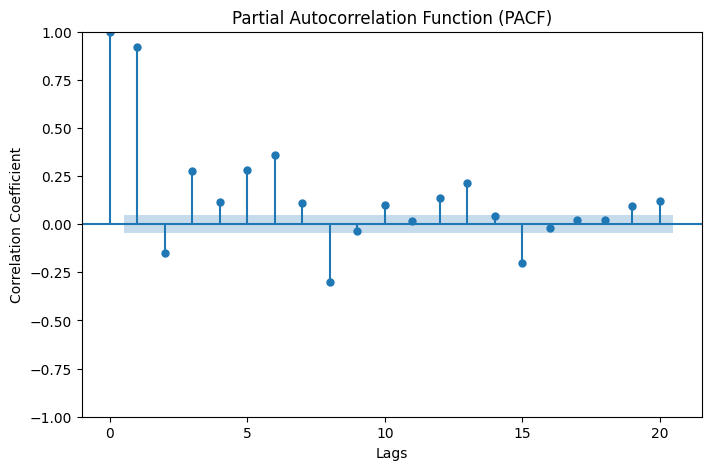

PACF Values:
 [ 1.          0.23192507 -0.01972359 -0.25025493 -0.14321336  0.12760599
  0.16093618  0.4042008  -0.08199888 -0.04181475 -0.12908203]


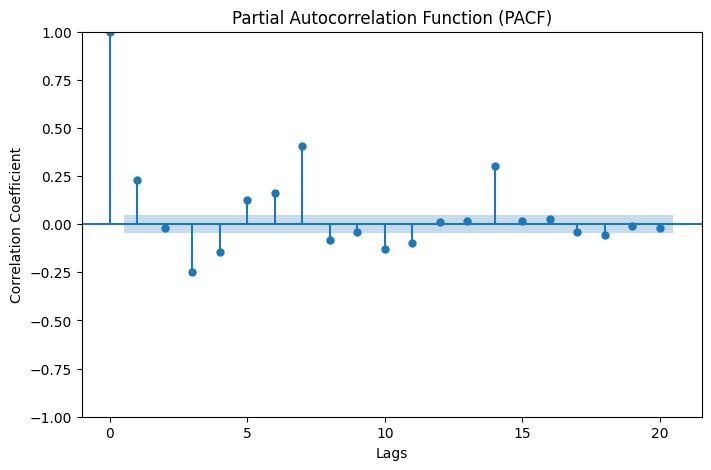

PACF Values:
 [ 1.          0.60876801 -0.22348497  0.16657404 -0.05766599  0.15793143
  0.45464287  0.33193162 -0.32426757 -0.14609171  0.04414993]


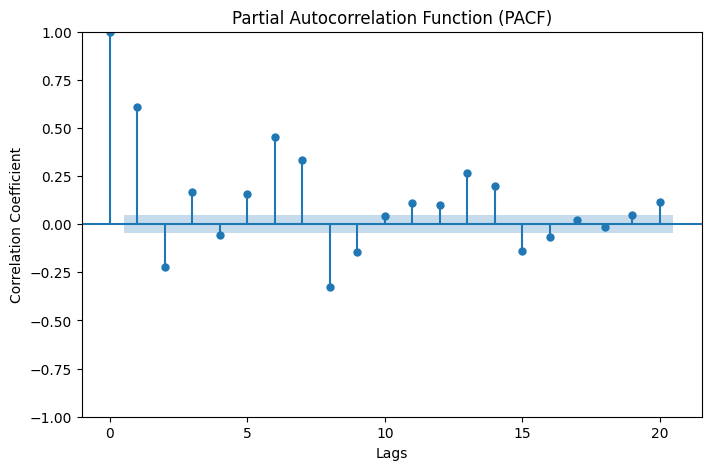

PACF Values:
 [ 1.          0.89816475  0.00847071  0.35980591  0.05944781  0.2372195
  0.48749621  0.39046751 -0.30872156 -0.17757295 -0.00798653]


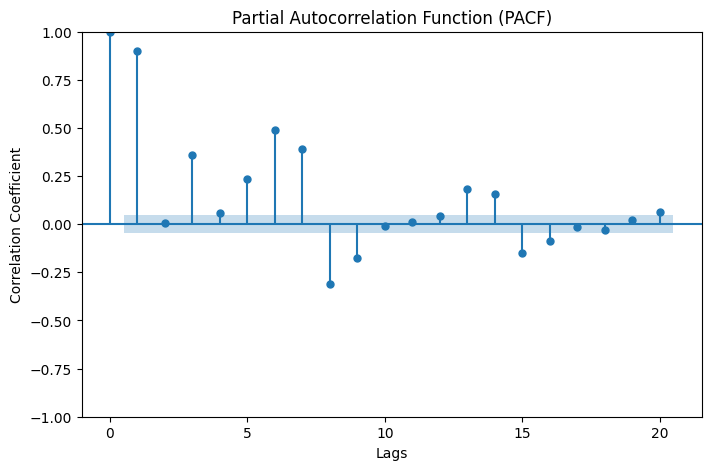

PACF Values:
 [ 1.          0.88738307  0.01469207  0.30499315  0.09846931  0.1723527
  0.35453785  0.22614787 -0.26970757 -0.12691438  0.00775272]


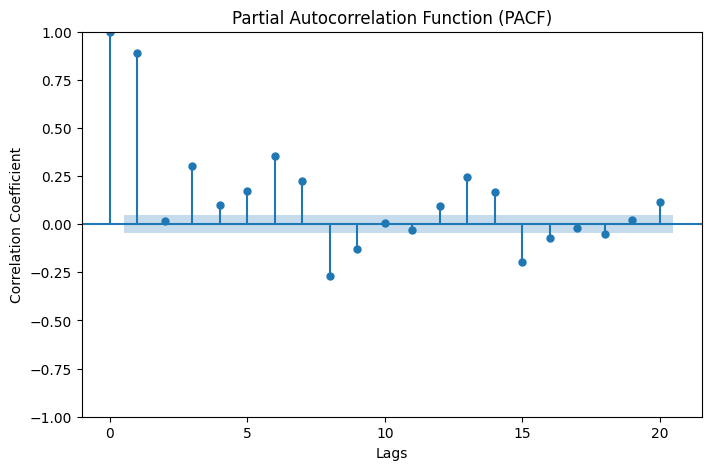

PACF Values:
 [ 1.          0.61469955  0.0659358  -0.12835267  0.15732612  0.41858478
  0.27966756  0.58919684 -0.25926412 -0.03196559 -0.08878303]


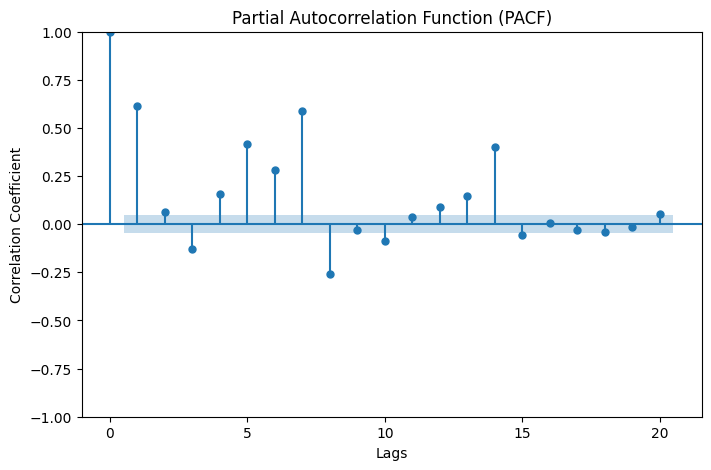

PACF Values:
 [ 1.          0.46294997 -0.28130365  0.09873026 -0.10387699  0.07252246
  0.51790991  0.52328499 -0.05260211 -0.11779927  0.01345899]


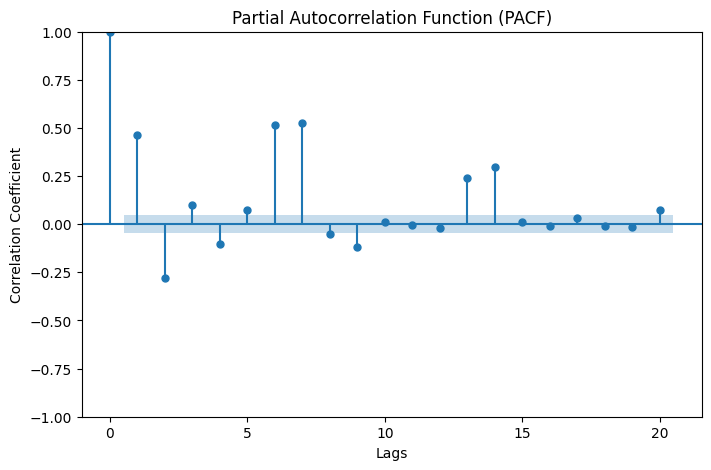

PACF Values:
 [ 1.00000000e+00  8.96315116e-01  2.79645250e-01  5.23173406e-01
  1.92077915e-01 -1.25318213e-01  1.19614332e-01  3.95502187e-01
 -3.90813396e-01 -5.02428996e-04 -6.09036914e-04]


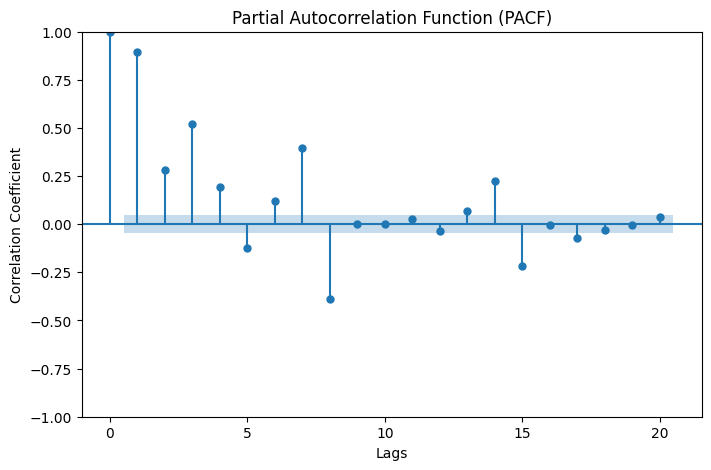

PACF Values:
 [ 1.          0.91954408 -0.03439165  0.16727911 -0.00264398  0.00519902
  0.0796727   0.00675987 -0.30205892 -0.04247147 -0.08221401]


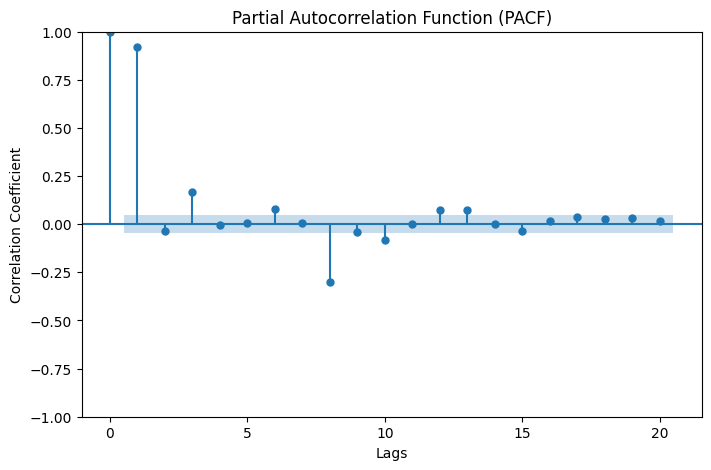

PACF Values:
 [ 1.          0.40601712  0.02316344 -0.24290322 -0.01463416  0.32766449
  0.1880167   0.58709855 -0.28641662 -0.04892378 -0.11794644]


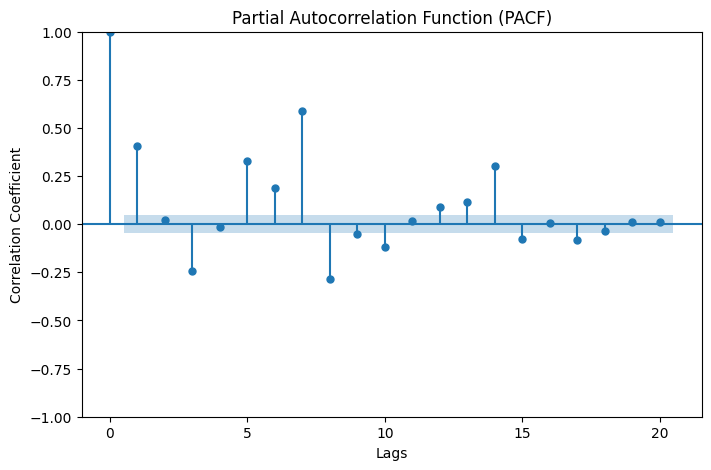

In [18]:
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.tsa.stattools import pacf

family=train['family'].unique()

for fam in family:
    sum_family_sales = train.groupby("family")
    sum_family_sales = sum_family_sales.get_group(fam)
    sum_family_sales = sum_family_sales.groupby('date', as_index=False)['sales'].sum()
    sum_family_sales['date'] = pd.to_datetime(sum_family_sales['date'])
    pacf_values = pacf(sum_family_sales['sales'], nlags=10, method="ywadjusted")
    print("PACF Values:\n", pacf_values)
    fig, ax = plt.subplots(figsize=(8, 5))
    plot_pacf(sum_family_sales['sales'], lags=20, ax=ax, method="ywadjusted")

    plt.title("Partial Autocorrelation Function (PACF)")
    plt.xlabel("Lags")
    plt.ylabel("Correlation Coefficient")
    plt.show()

In [47]:
from statsmodels.tsa.stattools import pacf
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_log_error
import numpy as np
from sklearn.model_selection import train_test_split


family=train['family'].unique()

for fam in family:
    sum_family_sales = train.groupby("family")
    sum_family_sales = sum_family_sales.get_group(fam)
    sum_family_sales = sum_family_sales.groupby('date', as_index=False)['sales'].sum()
    sum_family_sales['date'] = pd.to_datetime(sum_family_sales['date'])
    pacf_values = pacf(sum_family_sales['sales'], nlags=10, method="ywadjusted")
    for index, value in enumerate(pacf_values):
        if value > 0.1:
            sum_family_sales[f'sales_lag{index+1}'] = sum_family_sales['sales'].shift(index+1)

    sum_family_sales = sum_family_sales.fillna(0.0)
    X = sum_family_sales.drop(columns=['date', 'sales'])
    y = sum_family_sales['sales']
    X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.4, random_state=42)

    model = XGBRegressor()
    model.fit(X_train, y_train)
    y_fit = model.predict(X_test)
    y_fit = np.clip(y_fit, a_min=0, a_max=None)
    train_rmse = mean_squared_log_error(y_test, y_fit)
    
    print(f"Family: {fam} | test RMSE: {train_rmse:.2f}")


Family: AUTOMOTIVE | test RMSE: 0.04
Family: BABY CARE | test RMSE: 0.23
Family: BEAUTY | test RMSE: 0.05
Family: BEVERAGES | test RMSE: 0.03
Family: BOOKS | test RMSE: 0.07
Family: BREAD/BAKERY | test RMSE: 0.01
Family: CELEBRATION | test RMSE: 0.64
Family: CLEANING | test RMSE: 0.02
Family: DAIRY | test RMSE: 0.02
Family: DELI | test RMSE: 0.02
Family: EGGS | test RMSE: 0.02
Family: FROZEN FOODS | test RMSE: 0.04
Family: GROCERY I | test RMSE: 0.02
Family: GROCERY II | test RMSE: 0.05
Family: HARDWARE | test RMSE: 0.06
Family: HOME AND KITCHEN I | test RMSE: 1.21
Family: HOME AND KITCHEN II | test RMSE: 0.65
Family: HOME APPLIANCES | test RMSE: 0.18
Family: HOME CARE | test RMSE: 8.09
Family: LADIESWEAR | test RMSE: 0.75
Family: LAWN AND GARDEN | test RMSE: 0.07
Family: LINGERIE | test RMSE: 0.04
Family: LIQUOR,WINE,BEER | test RMSE: 2.82
Family: MAGAZINES | test RMSE: 0.19
Family: MEATS | test RMSE: 0.01
Family: PERSONAL CARE | test RMSE: 0.03
Family: PET SUPPLIES | test RMSE: 0.35
